# Images Stitching

In this notebook: |
--- |
<a href="#1"> Implement SIFT for feature detection and matching using OpenCV. </a>|
<a href="#2"> Estimate the projection matrix between two images using RANSAC. </a>|
<a href="#3"> Register the images based on the estimated projection or homography matrix. </a>|
<a href="#4"> Combine the registered images into a single, seamless image.  </a>|



### 1. Implement SIFT for feature detection and matching using OpenCV. <a id='1'></a>
SIFT (Scale-Invariant Feature Transform) is a feature detection algorithm in computer vision to detect and describe local features in images. I'll use OpenCV to implement SIFT for feature detection and matching. But first, let's import the necessary libraries and load the images.

In [1]:
import cv2 as cv
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

%matplotlib inline
mpl.rcParams['figure.figsize'] = (20, 10)
mpl.rcParams['image.cmap'] = 'gray'
mpl.rcParams['figure.dpi'] = 100

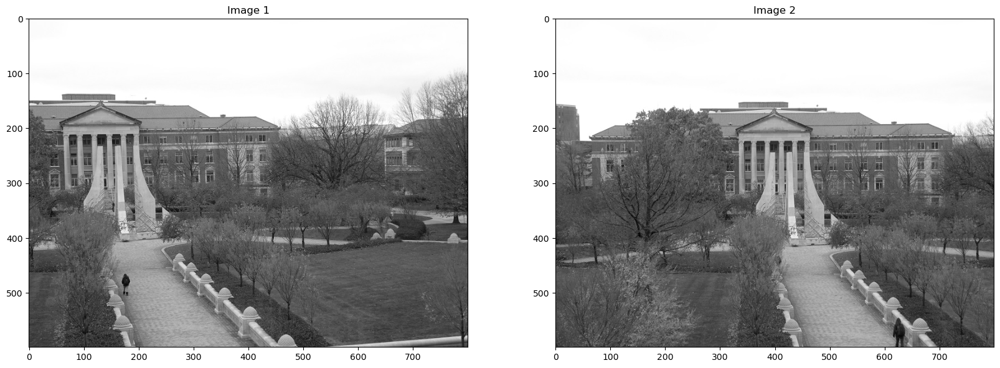

In [2]:
'''
1) Load Images.
2) Convert to Grayscale.
'''

img1 = cv.imread('1.jpg', cv.IMREAD_GRAYSCALE)
img2 = cv.imread('2.jpg', cv.IMREAD_GRAYSCALE)

fig, ax = plt.subplots(1, 2)
ax[0].imshow(img1)
ax[0].set_title('Image 1')
ax[1].imshow(img2)
ax[1].set_title('Image 2')
plt.show()


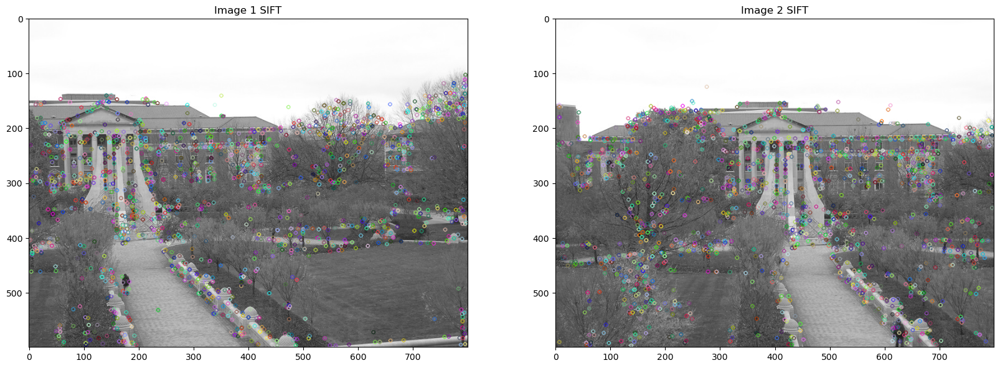

In [3]:
'''
3) Detect SIFT Features.
'''

sift = cv.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(img1, None)
keypoints2, descriptors2 = sift.detectAndCompute(img2, None)

img1_sift = cv.drawKeypoints(img1, keypoints1, None)
img2_sift = cv.drawKeypoints(img2, keypoints2, None)

plt.figure()
plt.subplot(121)
plt.imshow(img1_sift)
plt.title('Image 1 SIFT')
plt.subplot(122)
plt.imshow(img2_sift)
plt.title('Image 2 SIFT')
plt.show();


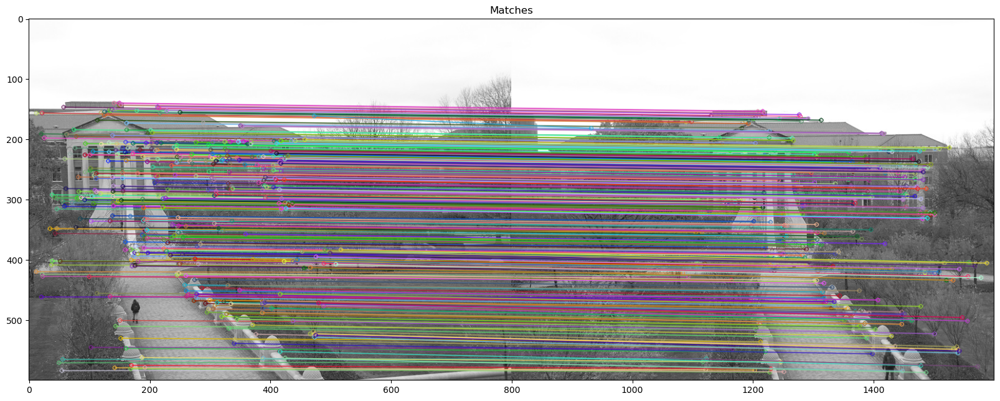

In [4]:
'''
4) Feature Matching.
5) Filter Matches.
'''

bf = cv.BFMatcher()
matches = bf.knnMatch(descriptors1, descriptors2, k=2)

good_matches = []
for m, n in matches:
    if m.distance < 0.5 * n.distance:
        good_matches.append(m)

img_matches = cv.drawMatches(img1, keypoints1, img2, keypoints2,
    good_matches, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure()
plt.imshow(img_matches)
plt.title('Matches')
plt.show();


After thresholding, the matches are now more uniform and the outliers are reduced. The matches are then drawn on the images to visualize the feature detection and matching.

### 2. Estimate the projection matrix between two images using RANSAC. <a id='2'></a>
*RANSAC* stands for **Random Sample Consensus**. It's a robust algorithm used to
estimate parameters in the presence of outliers. In computer vision, it's often used
to automatically estimate geometric transformations between images. In this
assignment, RANSAC is used to estimate the geometric transformation (e.g.,
homography) between the two given images. By randomly selecting pairs of
corresponding points, RANSAC fits a geometric model to these points and
identifies inliers (true point correspondences). The final model represents the
transformation that best aligns the two images.

[[ 8.39769298e-01 -1.84082585e-02  2.79925680e+02]
 [-4.04959021e-02  9.42792421e-01  2.37610088e+01]
 [-1.91089864e-04 -7.87951128e-06  1.00000000e+00]]


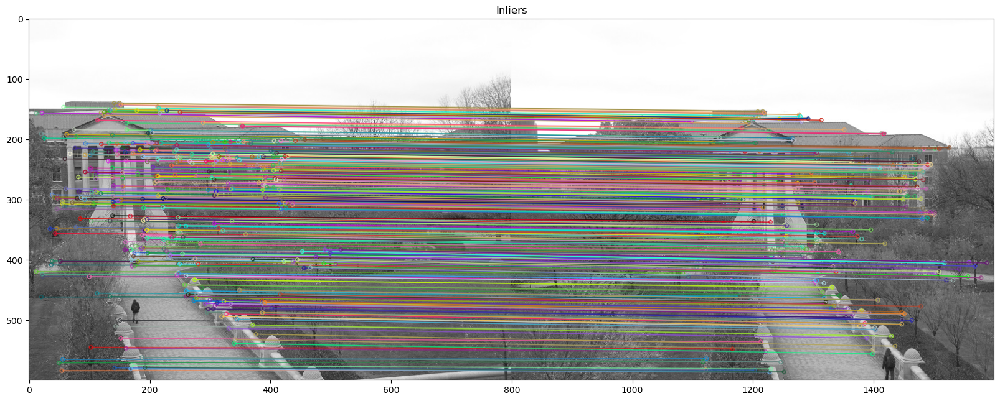

In [5]:
'''
6) Estimate Projection Matrix using RANSAC.
'''

# https://docs.opencv.org/3.4/d1/de0/tutorial_py_feature_homography.html

ransac = cv.RANSAC
homography, mask = cv.findHomography(
    np.array([keypoints1[m.queryIdx].pt for m in good_matches]),
    np.array([keypoints2[m.trainIdx].pt for m in good_matches]),
    cv.RANSAC, 5.0)

print(homography)

# draw inliers
inliers = [m for m, msk in zip(good_matches, mask) if msk]
img_matches_inliers = cv.drawMatches(img1, keypoints1, img2, keypoints2,
    inliers, None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.imshow(img_matches_inliers);
plt.title('Inliers');
plt.show();


Looks fair and close to the matches we have seen in the previous step.

### 3. Register the images based on the estimated projection or homography matrix. <a id='3'></a>

In [6]:
'''
7) Register Images.
'''

warped = cv.warpPerspective(img1, homography,
                                (img1.shape[1] + img2.shape[1], img2.shape[0]))


### 4. Combine the registered images into a single, seamless image. <a id='4'></a>

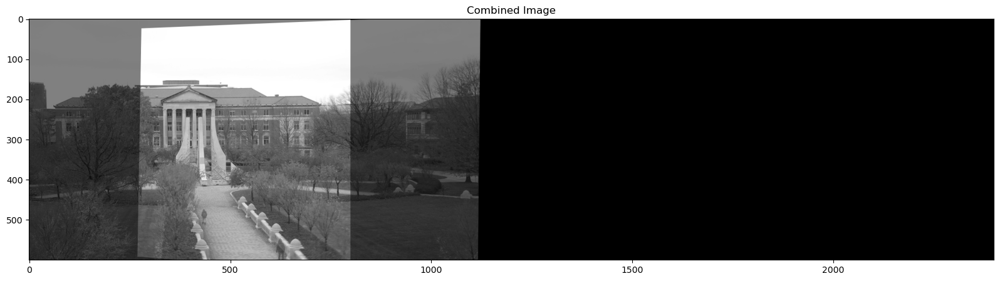

In [7]:
'''
8) Combine images and Display Results.
'''

# Determine overlapping region
h, w = img1.shape
pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
dst_pts = cv.perspectiveTransform(pts, homography)

# Create a new image with sufficient size, call it output image
output_height = max(img2.shape[0], warped.shape[0])
output_width = img2.shape[1] + warped.shape[1]
output = np.zeros((output_height, output_width), dtype=np.uint8)

# Copy images
output[:img2.shape[0], :img2.shape[1]] = img2

# Use homography to transform the first image with respect to the reference or second image
warped_img = cv.warpPerspective(img1, homography, (output.shape[1], output.shape[0]))
Weighted_output = cv.addWeighted(output, 0.5, warped_img, 0.5, 0)
Unweighted_output = np.maximum(output, warped_img)  # Take maximum value of each pixel

plt.figure(figsize=(20, 5))
plt.imshow(Weighted_output, cmap='gray')
plt.title('Combined Image')
plt.show()

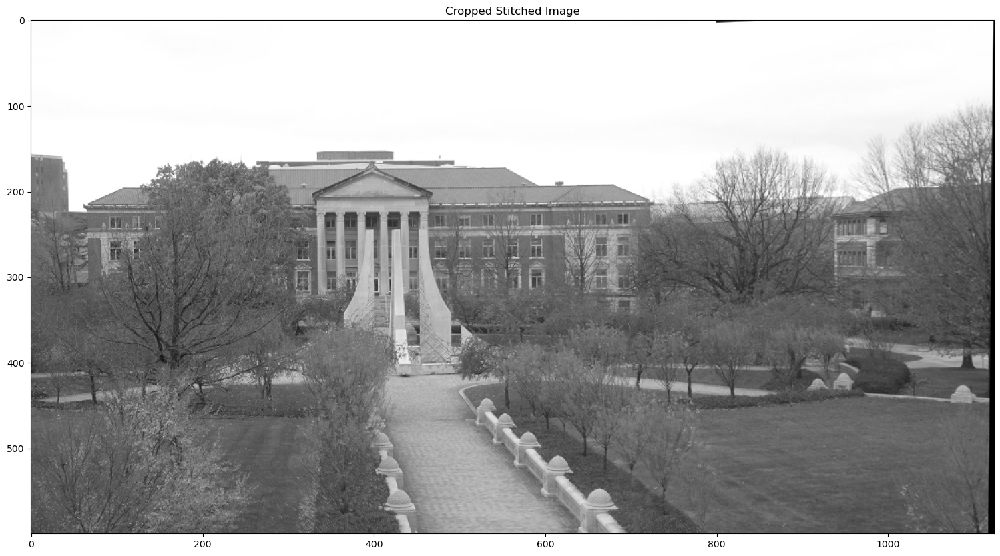

In [8]:
# Here I crop the image to remove the black border
# https://www.geeksforgeeks.org/find-and-draw-contours-using-opencv-python/

mask = cv.threshold(Unweighted_output, 1, 255, cv.THRESH_BINARY)[1]

contours, _ = cv.findContours(mask, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
x, y, w, h = cv.boundingRect(contours[0])
output = Unweighted_output[y:y+h, x:x+w]

plt.figure(figsize=(20, 10))
plt.imshow(output, cmap='gray')
plt.title('Cropped Stitched Image')
plt.show()


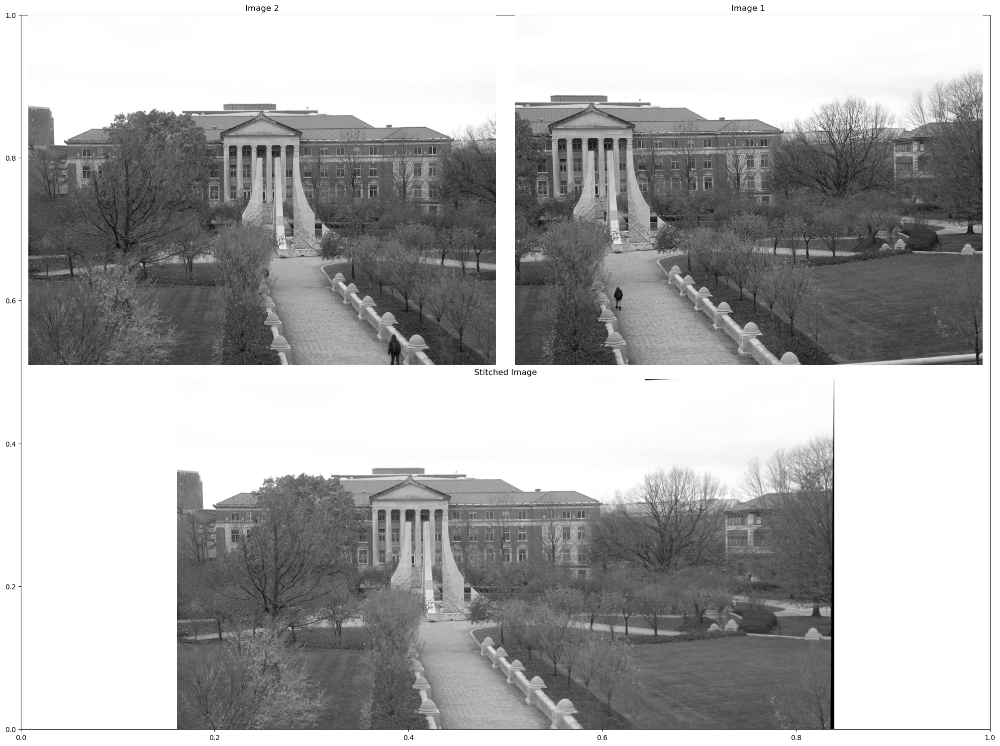

In [9]:
# https://matplotlib.org/stable/api/figure_api.html#matplotlib.figure.FigureBase.add_gridspec

fig, _ = plt.subplots(figsize=(20, 15))
gs = fig.add_gridspec(2, 2)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[1, :])

ax1.imshow(img2, cmap='gray')
ax1.set_title('Image 2')
ax1.axis('off')

ax2.imshow(img1, cmap='gray')
ax2.set_title('Image 1')
ax2.axis('off')

ax3.imshow(output, cmap='gray')
ax3.set_title('Stitched Image')
ax3.axis('off')

plt.tight_layout(pad=0.5)
plt.show()


Here we can see the final result of the image stitching process. The two images are now registered and combined into a single, seamless image. The overlapping regions are blended together to create a smooth transition between the two images.

Now we can read the two colored images and use the homography we've estimated above to stitch them together. The result is again a single, seamless image that combines the two input images into one, but now it's colored.

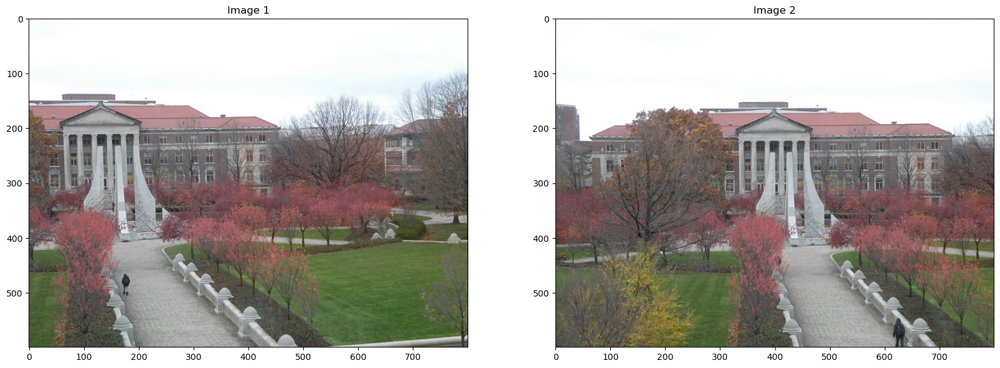

In [10]:
# Here I read and display the original images for comparison

cimg1 = cv.imread('1.jpg')
cimg2 = cv.imread('2.jpg')

fig, ax = plt.subplots(1, 2)
ax[0].imshow(cv.cvtColor(cimg1, cv.COLOR_BGR2RGB))
ax[0].set_title('Image 1')
ax[1].imshow(cv.cvtColor(cimg2, cv.COLOR_BGR2RGB))
ax[1].set_title('Image 2')

plt.show()

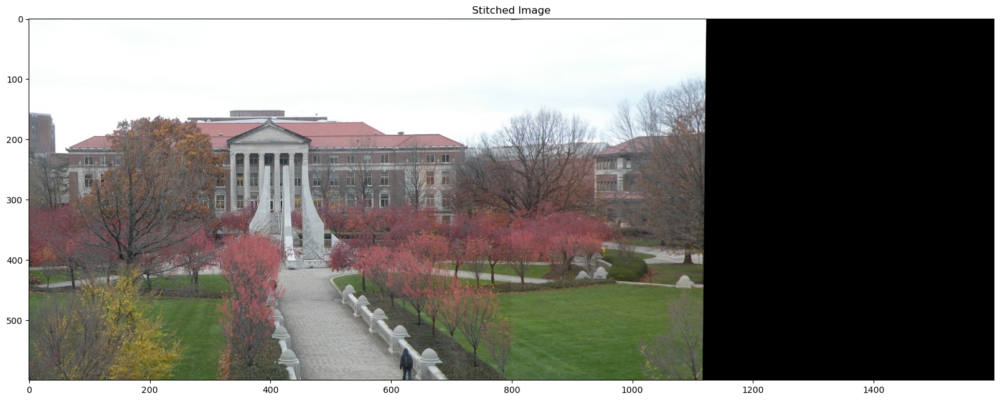

In [11]:
# Here I apply the homography to the first image

result = cv.warpPerspective(cimg1, homography, (cimg1.shape[1] + cimg2.shape[1], cimg2.shape[0]))
result[0:cimg2.shape[0], 0:cimg2.shape[1]] = cimg2

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Stitched Image')
plt.show()

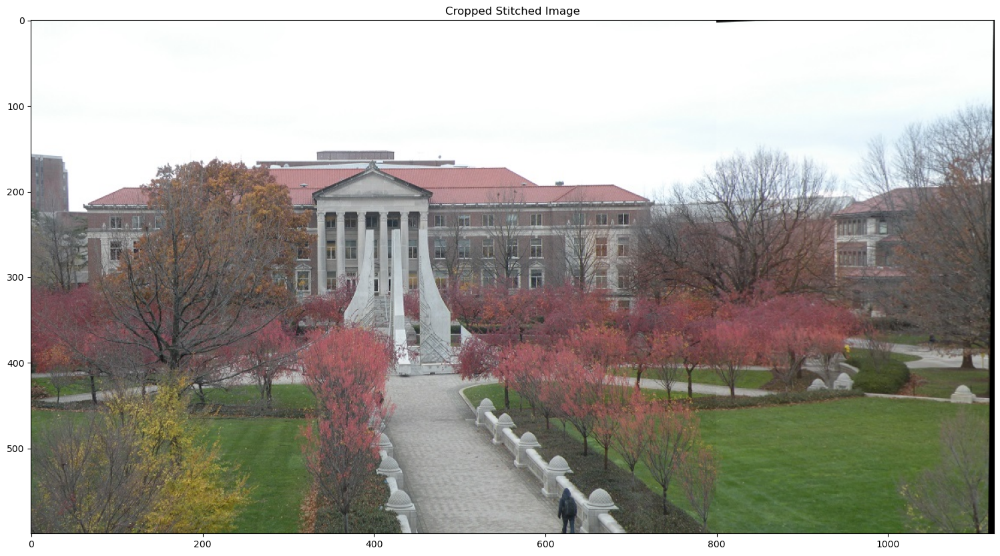

In [12]:
# And now I use the bounding box I used above to crop the image once again

result = result[y:y+h, x:x+w]

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
plt.title('Cropped Stitched Image')
plt.show()


Now it's time to save the final results, the colored stitched image and the grayscale for reference.

In [13]:
cv.imwrite('grayscale.jpg', output)
cv.imwrite('color.jpg', result)


True